### DATA ANALYSIS OFERTAS PROJECTE BD 2022

### Introduction

In [2]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

Import data of job offerts from the scrapped data contained in `infojobs_data.csv` and begin analyzing it:

In [12]:
df = pd.read_json("infojobs_data.json")

In [13]:
df.head()

,title,company,description,status,location,modality,release_date,agreement,work_time,salary,id,education,category
0,Auditor / Controller Interno,Sector Retail,Controller interno de procesos de gestión Audi...,ACTIVE,Ourense,Presencial,Hace 15h,Contrato indefinido,Jornada completa,21.000 € - 40.000 € Bruto/año,1,Grado,Administración de empresas
1,Assistant Business Manager,GRUPO GIRO,Grupo Giró es referente mundial en el envasado...,ACTIVE,Badalona,Híbrido,Hace 5d,Contrato indefinido,Jornada completa,Salario no disponible,2,Grado,Administración de empresas
2,FINANCE MANAGER,Fed Finance,"Desde Fed Finance, consultoría líder en headhu...",ACTIVE,Madrid,Híbrido,Hace 3m,Contrato indefinido,Jornada completa,50.000 € - 60.000 € Bruto/año,3,Grado,Administración de empresas
3,Project Administrator - Técnico de Gestión I+D,IMDEA Networks,IMDEA Networks es un instituto de investigació...,ACTIVE,Leganés,Híbrido,Hace 3m,Contrato de duración determinada,Jornada completa,24.000 € - 27.000 € Bruto/año,4,Grado,Administración de empresas
4,Becario/a administrativo/a,"NEW LINE EVENTS, S.L.",¿Eres una persona con capacidad de comunicació...,ACTIVE,Madrid,Híbrido,Hace 3m,Contrato formativo,Jornada intensiva - indiferente,Salario no disponible,5,Grado,Administración de empresas


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41179 entries, 0 to 41178
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         41179 non-null  object
 1   company       41179 non-null  object
 2   description   41179 non-null  object
 3   status        41179 non-null  object
 4   location      41179 non-null  object
 5   modality      36884 non-null  object
 6   release_date  41179 non-null  object
 7   agreement     41179 non-null  object
 8   work_time     41179 non-null  object
 9   salary        41179 non-null  object
 10  id            41179 non-null  int64 
 11  education     41179 non-null  object
 12  category      41179 non-null  object
dtypes: int64(1), object(12)
memory usage: 4.1+ MB


### DATA CLEANING

We want to focus mainly on two columns: `salary` and `release_date`.

For `salary`, we want to transform a sentence like _"Más de 20.000 €"_ in the integer `20000`, representing the brute annual perception for that position. For ranges like _"1.000 € - 2.000 € Bruto/mes"_ or _"21.000 € - 40.000 € Bruto/año"_, we are gonna compute the mean annual value.

Also, we have to transform "Salario no disponible" in a null or nan value.

In [15]:
def salaryTransform(salary):
    
    # Get rid of Null values
    # Also, we are not gonna count hour salaries because of the distorsion they 
    # generate on the annual salary measure.
    if salary == "Salario no disponible" or "hora" in salary: return None

    values = []
    words = salary.split(" ")

    for i, word in enumerate(words):
        if word == "€": 
            if "." in words[i-1]:
                salary_value = words[i-1].split(".")
                values.append(int(salary_value[0]) * 1000 + int(salary_value[1]))

            else: values.append(int(words[i-1]))

    # Compute the mean Salary
    meanSalary = values[0]
    if len(values) == 2: 
        meanSalary += values[1]
        meanSalary /= 2

    if 'mes' in salary: meanSalary *= 12
    return int(meanSalary)


print(salaryTransform("Más de 20.000 €"))
print(salaryTransform("50.000 € - 60.000 € Bruto/año"))
print(salaryTransform("1200 € - 1200 € Bruto/mes"))


20000
55000
14400


In [16]:
df['salary'] = df['salary'].apply(salaryTransform).convert_dtypes()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41179 entries, 0 to 41178
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         41179 non-null  object
 1   company       41179 non-null  object
 2   description   41179 non-null  object
 3   status        41179 non-null  object
 4   location      41179 non-null  object
 5   modality      36884 non-null  object
 6   release_date  41179 non-null  object
 7   agreement     41179 non-null  object
 8   work_time     41179 non-null  object
 9   salary        17703 non-null  Int64 
 10  id            41179 non-null  int64 
 11  education     41179 non-null  object
 12  category      41179 non-null  object
dtypes: Int64(1), int64(1), object(11)
memory usage: 4.1+ MB


In the case of `release_date`, we will consider two types of expressions:

A timedelta form, where date is preceded by _"Hace"_ and measured in hours ("h"), minutes ("m") or days ("d"). Examples: _"Hace 3d"_, _"Hace 10m"_, ...

Or a datetime form, specifying day and month: _"14 mar"_, _"28 abr"_, _"3 may"_ all referencing times of this year. Those three months are basically all the months we should consider.

So we are gonna transform the expressions to a datetime format. For the first type, we should remove the corresponding time to the fixed date of the scrapping, which was _"14/05/22"_.

In [17]:
for i in range(1000):
    print(df.iloc[i]['release_date'])

Hace 15h
Hace 5d
Hace 3m
Hace 3m
Hace 3m
Hace 3m
Hace 12m
Hace 14m
Hace 21m
Hace 33m
Hace 33m
Hace 6d
Hace 6d
Hace 1h
Hace 1h
Hace 1h
Hace 1h
Hace 1h
Hace 1h
Hace 1h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
Hace 2h
26 abr
13 abr
Hace 2h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 3h
Hace 4h
Hace 4h
Hace 4h
Hace 4h
Hace 4h
Hace 4h
Hace 4h
Hace 4h
Hace 5h
Hace 5h
Hace 5h
Hace 6h
Hace 14h
Hace 15h
Hace 18h
Hace 18h
Hace 18h
Hace 18h
Hace 19h
Hace 19h
Hace 19h
Hace 19h
Hace 19h
Hace 19h
Hace 20h
Hace 20h
Hace 20h
Hace 20h
Hace 20h
Hace 20h
Hace 20h
Hace 20h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 21h
Hace 22h
Hace 22h
Hace 22h
Hace 22h
Hace 23h
Hace 23h
Hace 23h
Hace 23h
Hace 23h
Hace 23h
Hace 23h
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 1d
Hace 

In [18]:
from datetime import date, datetime, timedelta

def transform_date(my_date):
    final_date = datetime(year = 2022, month = 5, day = 14)

    if "Hace" in my_date:
        if "d" in my_date:
            final_date -= timedelta(days = int(my_date[-2]))

    elif "mar" in my_date:
        final_date = datetime(year = 2022, month = 3, day = int(my_date.split(" ")[0]))

    elif "abr" in my_date:
        final_date = datetime(year = 2022, month = 4, day = int(my_date.split(" ")[0]))

    elif "may" in my_date:
        final_date = datetime(year = 2022, month = 5, day = int(my_date.split(" ")[0]))

    else: final_date = None

    return final_date

for i in range(100):
    my_date = df.iloc[i]['release_date']
    print(my_date, transform_date(my_date))

Hace 15h 2022-05-14 00:00:00
Hace 5d 2022-05-09 00:00:00
Hace 3m 2022-05-14 00:00:00
Hace 3m 2022-05-14 00:00:00
Hace 3m 2022-05-14 00:00:00
Hace 3m 2022-05-14 00:00:00
Hace 12m 2022-05-14 00:00:00
Hace 14m 2022-05-14 00:00:00
Hace 21m 2022-05-14 00:00:00
Hace 33m 2022-05-14 00:00:00
Hace 33m 2022-05-14 00:00:00
Hace 6d 2022-05-08 00:00:00
Hace 6d 2022-05-08 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 1h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
Hace 2h 2022-05-14 00:00:00
26 abr 2022-04-26 00:00:00
13 abr 2022-04-13 00:00:00
Hace 2h 2022-05-

In [19]:
df['release_date'] = df['release_date'].apply(transform_date)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41179 entries, 0 to 41178
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   title         41179 non-null  object        
 1   company       41179 non-null  object        
 2   description   41179 non-null  object        
 3   status        41179 non-null  object        
 4   location      41179 non-null  object        
 5   modality      36884 non-null  object        
 6   release_date  41176 non-null  datetime64[ns]
 7   agreement     41179 non-null  object        
 8   work_time     41179 non-null  object        
 9   salary        17703 non-null  Int64         
 10  id            41179 non-null  int64         
 11  education     41179 non-null  object        
 12  category      41179 non-null  object        
dtypes: Int64(1), datetime64[ns](1), int64(1), object(10)
memory usage: 4.1+ MB


In [20]:
# Finally, let's invalidate those three offerts with null date
df.loc[df['release_date'].isnull(), 'status'] = "INACTIVE"

In [21]:
# Better to change the type to DB consistency
df['status'] = df['status'].apply(lambda x: x == "ACTIVE")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41179 entries, 0 to 41178
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   title         41179 non-null  object        
 1   company       41179 non-null  object        
 2   description   41179 non-null  object        
 3   status        41179 non-null  bool          
 4   location      41179 non-null  object        
 5   modality      36884 non-null  object        
 6   release_date  41176 non-null  datetime64[ns]
 7   agreement     41179 non-null  object        
 8   work_time     41179 non-null  object        
 9   salary        17703 non-null  Int64         
 10  id            41179 non-null  int64         
 11  education     41179 non-null  object        
 12  category      41179 non-null  object        
dtypes: Int64(1), bool(1), datetime64[ns](1), int64(1), object(9)
memory usage: 3.8+ MB


Now that the data has been cleaned, better to save it again as a `.csv` file:

In [22]:
df.to_csv("./infojobs_data.csv", index = False)

### DATA ANALYSIS

In [23]:
df = pd.read_csv("./infojobs_data.csv", index_col="id")
df.head()

,title,company,description,status,location,modality,release_date,agreement,work_time,salary,education,category
id,,,,,,,,,,,,
1,Auditor / Controller Interno,Sector Retail,Controller interno de procesos de gestión Audi...,True,Ourense,Presencial,2022-05-14,Contrato indefinido,Jornada completa,30500.0,Grado,Administración de empresas
2,Assistant Business Manager,GRUPO GIRO,Grupo Giró es referente mundial en el envasado...,True,Badalona,Híbrido,2022-05-09,Contrato indefinido,Jornada completa,NaN,Grado,Administración de empresas
3,FINANCE MANAGER,Fed Finance,"Desde Fed Finance, consultoría líder en headhu...",True,Madrid,Híbrido,2022-05-14,Contrato indefinido,Jornada completa,55000.0,Grado,Administración de empresas
4,Project Administrator - Técnico de Gestión I+D,IMDEA Networks,IMDEA Networks es un instituto de investigació...,True,Leganés,Híbrido,2022-05-14,Contrato de duración determinada,Jornada completa,25500.0,Grado,Administración de empresas
5,Becario/a administrativo/a,"NEW LINE EVENTS, S.L.",¿Eres una persona con capacidad de comunicació...,True,Madrid,Híbrido,2022-05-14,Contrato formativo,Jornada intensiva - indiferente,NaN,Grado,Administración de empresas


In [24]:
df.shape

(41179, 12)

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41179 entries, 1 to 41179
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         41179 non-null  object 
 1   company       41179 non-null  object 
 2   description   41179 non-null  object 
 3   status        41179 non-null  bool   
 4   location      41179 non-null  object 
 5   modality      36884 non-null  object 
 6   release_date  41176 non-null  object 
 7   agreement     41179 non-null  object 
 8   work_time     41179 non-null  object 
 9   salary        17703 non-null  float64
 10  education     41179 non-null  object 
 11  category      41179 non-null  object 
dtypes: bool(1), float64(1), object(10)
memory usage: 3.8+ MB


**Analizing categorical variables**

In [256]:
df['category'].value_counts()

Comercial y ventas                  6402
Informática y telecomunicaciones    4257
Turismo y restauración              3898
Otros                               3864
Profesiones, artes y oficios        3441
Administración de empresas          3200
Atención a clientes                 2631
Compras, logística y almacén        2195
Ingenieros y técnicos               2052
Sanidad y salud                     1944
Ventas al detalle                   1757
Calidad, producción e I+D           1157
Recursos humanos                    1095
Inmobiliario y construcción          977
Marketing y comunicación             734
Educación y formación                438
Finanzas y banca                     405
Diseño y artes gráficas              238
Legal                                237
Sector Farmacéutico                  141
Administración Pública               116
Name: category, dtype: int64

In [257]:
df['education'].value_counts()

Educación Secundaria Obligatoria    9796
Grado                               8034
Ciclo Formativo Grado Superior      7904
Ciclo Formativo Grado Medio         7075
Sin estudios                        4335
Batchillerato                       4035
Name: education, dtype: int64

In [258]:
df['work_time'].value_counts()

Jornada completa                   31327
Jornada indiferente                 3019
Jornada parcial - indiferente       2344
Jornada parcial - mañana            1258
Jornada intensiva - indiferente     1076
Jornada intensiva - mañana           833
Jornada parcial - tarde              831
Jornada intensiva - tarde            299
Jornada intensiva - noche            100
Jornada parcial - noche               92
Name: work_time, dtype: int64

In [259]:
df['agreement'].value_counts()

Contrato indefinido                 22188
Contrato de duración determinada     8658
Contrato otros contratos             5647
Contrato autónomo                    1426
Contrato fijo discontinuo            1342
Contrato a tiempo parcial            1239
Contrato formativo                    577
Contrato de relevo                    102
Name: agreement, dtype: int64

In [260]:
df['modality'].value_counts()

Presencial          30376
Híbrido              4875
Solo teletrabajo     1633
Name: modality, dtype: int64

**Analizing `salary` and correlation with the previous variables**

In [261]:
df['salary'].describe()

count     17703.000000
mean      22023.647348
std       10885.649856
min           1.000000
25%       16200.000000
50%       19800.000000
75%       25500.000000
max      234000.000000
Name: salary, dtype: float64

<AxesSubplot:>

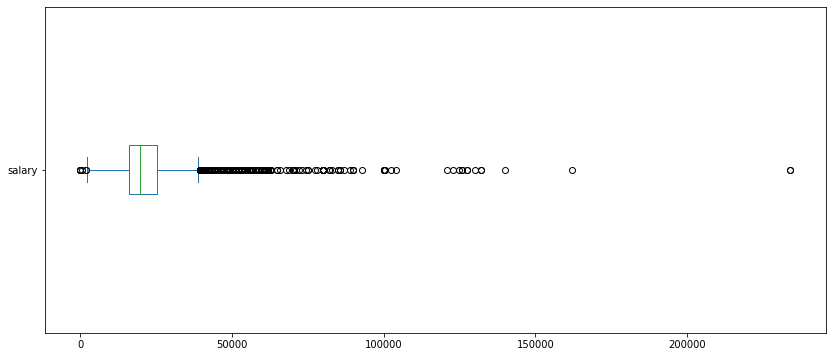

In [262]:
df_salary = df.loc[df['salary'] != np.NaN]
df_salary['salary'].plot(kind = 'box', vert = False, figsize=(14,6))

It seems the 95% of the distribution is between 0 and 60.000 Brute annual income. Let's look further:

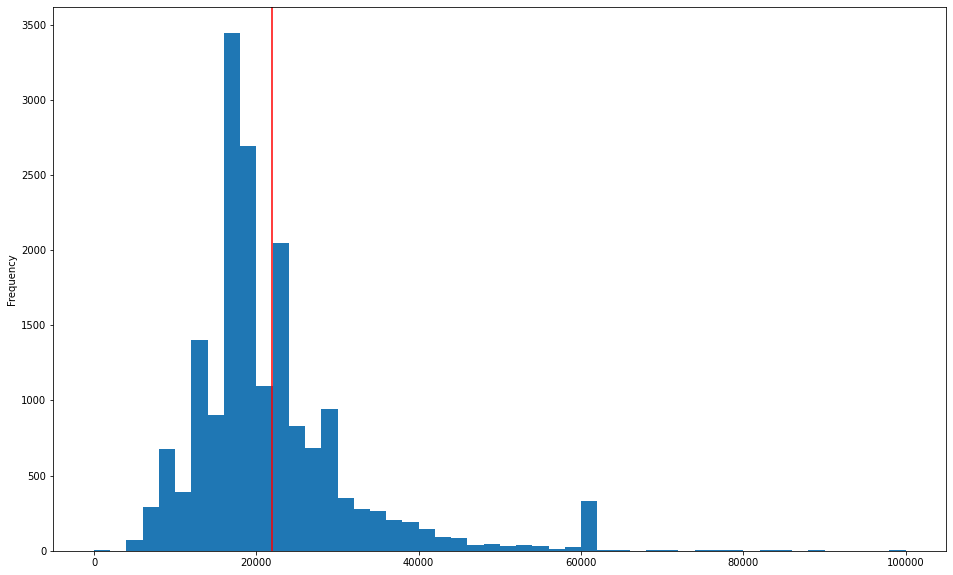

In [263]:
df_salary = df_salary.loc[(0 < df['salary']) & (df_salary['salary'] <= 100000)]
ax = df_salary['salary'].plot(kind = 'hist', bins = 50, figsize=(16,10))
ax.axvline(df_salary['salary'].mean(), color='red')

Is the 60000-62000 frequency (5000 monthly) normal? It could be, considering that specifying 5000€ Brute/month is 'rounded'.

Looking at the bivariant distribution, you could realize most of those values come from the `Comercial y ventas` category and the education of `Bachillerato`:

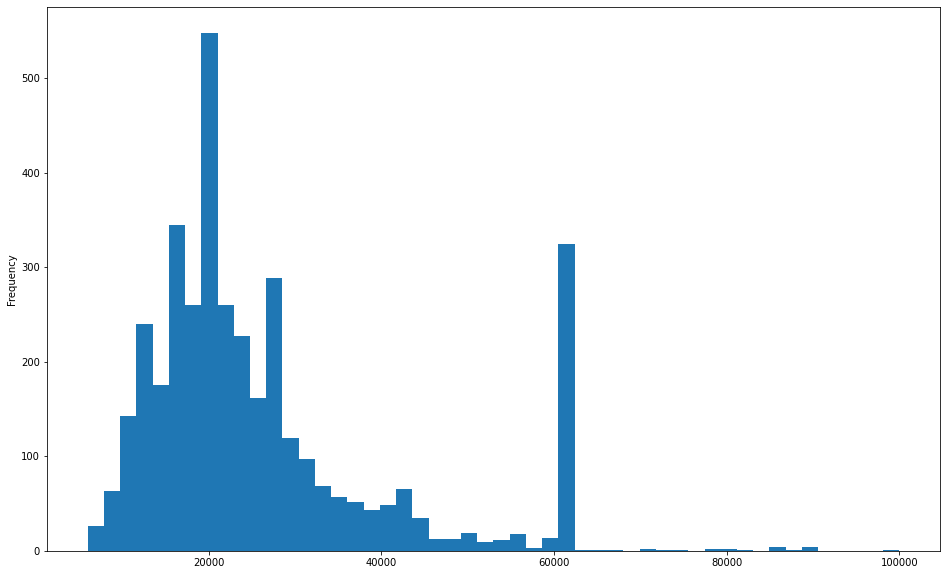

In [264]:
df_salary_comercial = df_salary.loc[df_salary['category'] == 'Comercial y ventas']
ax = df_salary_comercial['salary'].plot(kind = 'hist', bins = 50, figsize=(16,10))

In [265]:
px.density_heatmap(df_salary, x="category", y="salary", width=700, height=700)

In [266]:
px.density_heatmap(df_salary, x="education", y="salary", width=700, height=700)

Let's analyse those 324 offerts...

In [267]:
misterious_offerts = df_salary_comercial.loc[(df_salary_comercial['education'] == "Batchillerato") & (df_salary_comercial['salary'] > 60000)]
misterious_offerts.head()

,title,company,description,status,location,modality,release_date,agreement,work_time,salary,education,category
id,,,,,,,,,,,,
33584,AGENTE COMERCIAL INMOBILIARIO,SAFTI,¿Eres un crack de las ventas o quieres aprende...,ACTIVE,Guadalajara,Solo teletrabajo,2022-05-14,Contrato autónomo,Jornada intensiva - indiferente,62000.0,Batchillerato,Comercial y ventas
33585,AGENTE COMERCIAL INMOBILIARIO,SAFTI,¿Eres un crack de las ventas o quieres aprende...,ACTIVE,Esplugues de Llobregat,Solo teletrabajo,2022-05-14,Contrato autónomo,Jornada intensiva - indiferente,62000.0,Batchillerato,Comercial y ventas
33586,AGENTE COMERCIAL INMOBILIARIO,SAFTI,¿Eres un crack de las ventas o quieres aprende...,ACTIVE,Huelva,Solo teletrabajo,2022-05-14,Contrato autónomo,Jornada intensiva - indiferente,62000.0,Batchillerato,Comercial y ventas
33587,AGENTE COMERCIAL INMOBILIARIO,SAFTI,¿Eres un crack de las ventas o quieres aprende...,ACTIVE,Écija,Solo teletrabajo,2022-05-14,Contrato autónomo,Jornada intensiva - indiferente,62000.0,Batchillerato,Comercial y ventas
33588,AGENTE COMERCIAL INMOBILIARIO,SAFTI,¿Eres un crack de las ventas o quieres aprende...,ACTIVE,Granadilla de Abona,Solo teletrabajo,2022-05-14,Contrato autónomo,Jornada intensiva - indiferente,62000.0,Batchillerato,Comercial y ventas


In [268]:
misterious_offerts['company'].value_counts()

SAFTI                                    321
CENTURY 21 Mediterranean Homes             2
REMAX ROSALES                              2
Inmobiliaria SEVILLA 2000 Real Estate      1
REMAX INSIGNIA                             1
PERCENT SERVICIOS INMOBILIARIOS SL         1
UMBRA REAL ESTATE SOCIEDAD LIMITADA        1
CENTURY21 Arquitectura                     1
DOMUS AUREA CAPITAL INVEST SL.             1
GRUPO REMAXJUMBO                           1
CENTURY 21 Pasifae                         1
RE/MAX Domus                               1
Name: company, dtype: int64

In [269]:
misterious_offerts_descriptions = misterious_offerts.loc[misterious_offerts['company'] == "SAFTI", 'description'].value_counts()

for description, count in zip(misterious_offerts_descriptions.index, misterious_offerts_descriptions.values):
    print("\n", count)
    print(description)


 185
¿Eres un crack de las ventas o quieres aprender?. ¿Tienes habilidades comunicativas y comerciales? ¿Quieres desarrollar tu futuro profesional dentro de una multinacional líder? O simplemente… ¿Te apetece un nuevo reto profesional? Y lo mejor de todo… ¡No te pongas límites porque cuantas más vendas, MÁS GANAS! ¡EN SAFTI TE ESTAMOS BUSCANDO! BENEFICIOS - Alto plan remunerativo sin competencia basado en unas comisiones que aumentan cuanto más crecen tus ventas, desde un 60% a un 99%. ¡NO TE PONGAS LÍMITES! - El mejor Plan de Formación de carrera del sector inmobiliario: completo, inicial y continuado. Estarás apoyado permanentemente por un equipo de formadores especializados que te ayudarán y se adaptarán a tu nivel de partida. Además, tendrás a tu disposición una academia para profesionalizar tu actividad. - Publicación en los portales inmobiliarios más relevantes y con más visibilidad para disparar tus ventas. - Herramientas digitales top y super fáciles de utilizar. - Plan de car

Same offert, repeated over locatities... bad practise from the company. Instead of removing them, I'm just gonna make their salary null and set `STATUS` to inactive:

In [26]:
df.loc[df['company'] == "SAFTI", 'status'] = False
df.loc[df['company'] == "SAFTI", 'salary'] = np.NaN
df.loc[df['company'] == "SAFTI", ['status', 'salary']]

,status,salary
id,,
10247,False,NaN
23606,False,NaN
33584,False,NaN
33585,False,NaN
33586,False,NaN
...,...,...
34560,False,NaN
34581,False,NaN
34582,False,NaN


In [27]:
# Also, better to remove all salaries > 100.000 and anullate those of companies that post too much high payed offerts
df.loc[df['salary'] > 100000, 'salary'] = np.NaN
df.loc[df['salary'] > 100000, 'status'] = False
df.loc[df['salary'] > 30000][['company', 'title']].value_counts().head()

company                                    title                                                                                       
SECTOR ALARM SPAIN                         ASESOR COMERCIAL SISTEMAS DE SEGURIDAD (Alta en Seguridad Social 40 horas + Plan de Carrera)    14
ElectryConsulting                          AGENTE COMERCIAL DE EMPRESAS - ALTA REMUNERACIÓN                                                12
Prevensystem                               Director/a de Oficina                                                                            6
Glomark Home                               Comercial con visitas concertadas (cartera de clientes propia)                                   5
TELECOMUNICACIONES INTEGRADAS ONE TELECOM  ASESOR COMERCIAL // ORANGE EMPRESAS                                                              4
dtype: int64

In [28]:
badCompany1 =   (df['company'] == "SECTOR ALARM SPAIN")
badCompany2 =   (df['company'] == "ElectryConsulting")

df.loc[badCompany1 | badCompany2, 'salary'] = np.NaN
df.loc[badCompany1 | badCompany2, 'status'] = False
df.loc[badCompany1 | badCompany2]

,title,company,description,status,location,modality,release_date,agreement,work_time,salary,education,category
id,,,,,,,,,,,,
9479,RESPONSABLE DE DESARROLLO DE NEGOCIO.,ElectryConsulting,En ElectryConsulting nos enfocamos en potencia...,False,Zaragoza,Presencial,2022-05-14,Contrato autónomo,Jornada indiferente,NaN,Educación Secundaria Obligatoria,Comercial y ventas
9481,RESPONSABLE DE DESARROLLO DE NEGOCIO.,ElectryConsulting,En ElectryConsulting nos enfocamos en potencia...,False,Toledo,Presencial,2022-05-14,Contrato autónomo,Jornada completa,NaN,Educación Secundaria Obligatoria,Comercial y ventas
9482,RESPONSABLE DE DESARROLLO DE NEGOCIO.,ElectryConsulting,En ElectryConsulting nos enfocamos en potencia...,False,Teguise,Presencial,2022-05-14,Contrato autónomo,Jornada completa,NaN,Educación Secundaria Obligatoria,Comercial y ventas
9483,RESPONSABLE DE DESARROLLO DE NEGOCIO.,ElectryConsulting,En ElectryConsulting nos enfocamos en potencia...,False,Tarragona,Presencial,2022-05-14,Contrato autónomo,Jornada completa,NaN,Educación Secundaria Obligatoria,Comercial y ventas
9484,RESPONSABLE DE DESARROLLO DE NEGOCIO.,ElectryConsulting,En ElectryConsulting nos enfocamos en potencia...,False,Santander,Presencial,2022-05-14,Contrato autónomo,Jornada completa,NaN,Educación Secundaria Obligatoria,Comercial y ventas
...,...,...,...,...,...,...,...,...,...,...,...,...
37538,REPRESENTANTE COMERCIAL EN SEVILLA (ALTA EN SE...,SECTOR ALARM SPAIN,En Sector Alarm estamos buscando comerciales q...,False,Sevilla,Presencial,2022-05-11,Contrato indefinido,Jornada completa,NaN,Sin estudios,Comercial y ventas
37541,COMERCIAL / VENDEDOR ALICANTE (INCORPORACION I...,SECTOR ALARM SPAIN,En Sector Alarm estamos buscando comerciales q...,False,Alicante/Alacant,Presencial,2022-05-11,Contrato indefinido,Jornada completa,NaN,Sin estudios,Comercial y ventas
37542,COMERCIAL / VENDEDOR ALMERÍA (INCORPORACION IN...,SECTOR ALARM SPAIN,En Sector Alarm estamos buscando comerciales q...,False,Almería,Presencial,2022-05-11,Contrato indefinido,Jornada completa,NaN,Sin estudios,Comercial y ventas


and now, the salary disribution remains stable:

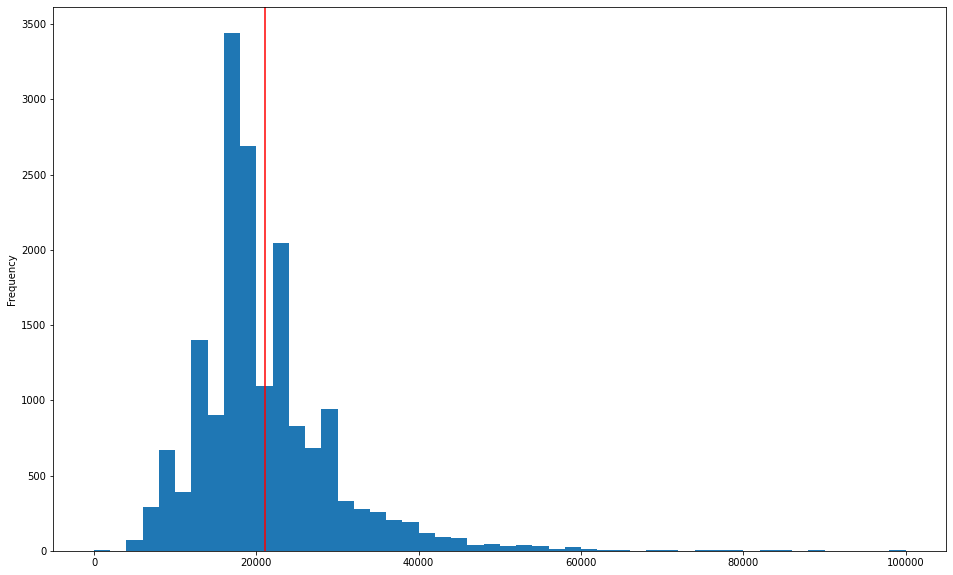

In [273]:
df_salary = df.loc[(df['salary'] != np.NaN) & (0 < df['salary']) & (df['salary'] <= 100000)]
ax = df_salary['salary'].plot(kind = 'hist', bins = 50, figsize=(16,10))
ax.axvline(df_salary['salary'].mean(), color='red')

Visual Representations:

In [274]:
px.density_heatmap(df_salary, x="agreement", y="work_time", 
                    marginal_x="histogram", marginal_y="histogram", 
                    width=1000, height=500)

In [275]:
education_counts = df.groupby(['education'])['salary'].count().reset_index()
fig=px.pie(education_counts, values = "salary", names="education", template="seaborn", width=900, height=700)
fig.update_traces(rotation=90, pull=0.05, textinfo="percent+label")

**Salary correlations**

We want to see if there's correlation of `salary` with `categories` (presumably), `education`, `work_time` or `agreement`:

In [276]:
salary_by_category = df_salary.groupby(["category"])[["salary"]].mean().reset_index()
salary_by_education = df_salary.groupby(["education"])[["salary"]].mean().reset_index()
salary_by_work_time = df_salary.groupby(["work_time"])[["salary"]].mean().reset_index()
salary_by_agreement = df_salary.groupby(["agreement"])[["salary"]].mean().reset_index()
salary_by_modality = df_salary.groupby(["modality"])[["salary"]].mean().reset_index()

In [277]:
# Salary by category
px.bar(salary_by_category[['category', 'salary']].sort_values('salary', ascending = False), 
        y = 'salary', x = 'category', color = 'category', title = "Salary by category")

There's a correlation and it makes sense. Also we as _Informàtics_ are first placed, so I'm good with it.

In [278]:
# Salary by education
px.bar(salary_by_education[['education', 'salary']].sort_values('salary', ascending = False), 
        y = 'salary', x = 'education', color = 'education', title = "Salary by education")

While the difference is not that big, we can also correlate the salary to the minimum required education level. Surprising enought that `Sin estudios` >= `ESO`.

In [279]:
# Salary by work_time
px.bar(salary_by_work_time[['work_time', 'salary']].sort_values('salary', ascending = False), 
        y = 'salary', x = 'work_time', color = 'work_time', title = "Salary by work time")

I wouldn't give much truth on this correlation, due to the higher difference between `work_time` populations.

In [280]:
# Salary by agreement
px.bar(salary_by_agreement[['agreement', 'salary']].sort_values('salary', ascending = False), 
        y = 'salary', x = 'agreement', color = 'agreement', title = "Salary by agreement")

In [281]:
# Salary by modality
px.bar(salary_by_modality[['modality', 'salary']].sort_values('salary', ascending = False), 
        y = 'salary', x = 'modality', color = 'modality', title = "Salary by modality")

**National Job Offers Density**

A direct way to represent visual spatial (2D) data is to use a [Cloropleth Map](https://en.wikipedia.org/wiki/Choropleth_map). 

In our problem, we can plot density information such as the number of offers by province, or the mean salary for each autonomous community using an administrative-bounded map of Spain. We will use Plotly for this aim, as explained here: https://plotly.com/python/choropleth-maps/

First of all, we will get the geometric data from a **geojson** file I downloaded from this source: 
https://github.com/codeforgermany/click_that_hood/blob/main/public/data/spain-provinces.geojson

In [282]:
# You can inspect the geojson format rendering the json
import json

spain_provinces_map = {}

with open('./spain-provinces.geojson') as file:
    spain_map = json.load(file)

for province in spain_map['features']:
    name = province['properties']['name']
    if "/" in name: name = name.split("/")[-1]
    
    spain_provinces_map[name] = province['properties']['cartodb_id'] 

spain_provinces = list(spain_provinces_map.keys())
spain_provinces.sort(key = lambda name: spain_provinces_map[name])

spain_provinces

['Álava',
 'Albacete',
 'Alicante',
 'Almería',
 'Ávila',
 'Badajoz',
 'Illes Balears',
 'Barcelona',
 'Burgos',
 'Cáceres',
 'Cádiz',
 'Castellón',
 'Ciudad Real',
 'Córdoba',
 'A Coruña',
 'Cuenca',
 'Girona',
 'Granada',
 'Guadalajara',
 'Guipúzcoa',
 'Huelva',
 'Huesca',
 'Jaén',
 'León',
 'Lleida',
 'La Rioja',
 'Lugo',
 'Madrid',
 'Málaga',
 'Murcia',
 'Navarra',
 'Ourense',
 'Asturias',
 'Palencia',
 'Las Palmas',
 'Pontevedra',
 'Salamanca',
 'Santa Cruz De Tenerife',
 'Cantabria',
 'Segovia',
 'Sevilla',
 'Soria',
 'Tarragona',
 'Teruel',
 'Toledo',
 'Valencia',
 'Valladolid',
 'Vizcaya',
 'Zamora',
 'Zaragoza',
 'Melilla',
 'Ceuta']

Now, we would like to classify each offert based on if its location is one of the provinces. By the moment, we're gonna consider just exact location coincides. 

In [283]:
locationIsProvince = df['location'].apply(lambda location: location in spain_provinces)
df['province'] = df.loc[locationIsProvince, 'location']
df['cartodb_id'] = df.loc[locationIsProvince, 'location'].apply(lambda province: spain_provinces_map[province])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41179 entries, 1 to 41179
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         41179 non-null  object 
 1   company       41179 non-null  object 
 2   description   41179 non-null  object 
 3   status        41179 non-null  object 
 4   location      41179 non-null  object 
 5   modality      36884 non-null  object 
 6   release_date  41176 non-null  object 
 7   agreement     41179 non-null  object 
 8   work_time     41179 non-null  object 
 9   salary        17311 non-null  float64
 10  education     41179 non-null  object 
 11  category      41179 non-null  object 
 12  province      18807 non-null  object 
 13  cartodb_id    18807 non-null  float64
dtypes: float64(2), object(12)
memory usage: 4.7+ MB


In order for correctly linking our data with the geojson features, we have to ensure they share an identifying attribute as `cartodb_id`. Once set this, you can group your data by locations just by counting or computing the mean of the feature of interest, in our case,`salary`. Once that's been acomplished, we'll use the `px.choropleth` function to draw the geographic plot.

In [284]:
offers_provinces = df.groupby(['cartodb_id', 'province'])[['title', 'salary']]
offers_provinces_count = offers_provinces.count()['title'].reset_index().rename(columns = {'title' : 'data'})
offers_provinces_mean = offers_provinces.mean()['salary'].reset_index().rename(columns = {'salary' : 'data'})

In [285]:
# First approach
fig = px.choropleth(    offers_provinces_count, 
                        geojson = spain_map, 
                        locations = "cartodb_id",
                        featureidkey="properties.cartodb_id",
                        color='data',
                        color_continuous_scale="Blues",
                        hover_data = ['cartodb_id', 'province', 'data'],
                        labels={'data':'Number of Offerts by Province'},
                        projection="mercator",
                    )

fig.update_geos(resolution=50, fitbounds="locations", visible = False)      
fig.update_layout(title_text = '2022 Spain Job Platform Offerts by Province', height = 900, width = 1000)
fig.show()

**Second approach: compute also job offers whose locations are not provinces**

In [286]:
locationNotProvince = df['location'].apply(lambda location: location not in spain_provinces)
df.loc[locationNotProvince].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22372 entries, 2 to 41178
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         22372 non-null  object 
 1   company       22372 non-null  object 
 2   description   22372 non-null  object 
 3   status        22372 non-null  object 
 4   location      22372 non-null  object 
 5   modality      20194 non-null  object 
 6   release_date  22370 non-null  object 
 7   agreement     22372 non-null  object 
 8   work_time     22372 non-null  object 
 9   salary        9411 non-null   float64
 10  education     22372 non-null  object 
 11  category      22372 non-null  object 
 12  province      0 non-null      object 
 13  cartodb_id    0 non-null      float64
dtypes: float64(2), object(12)
memory usage: 2.6+ MB


For the rest, I'm going to manually get the province of the most non recognised location.

In [287]:
df_not_located = df.loc[df['province'].isnull(), 'location']
df_not_located.value_counts().head(60)

Palma de Mallorca                             700
Bilbao                                        588
Alicante/Alacant                              479
Vitoria-Gasteiz                               344
Alcobendas                                    325
Pamplona/Iruña                                311
Donostia-San Sebastián                        282
Sant Cugat del Vallès                         265
Vigo                                          245
Marbella                                      242
Las Palmas de Gran Canaria                    231
Santander                                     221
Sabadell                                      216
Oviedo                                        204
Eivissa                                       203
Pozuelo de Alarcón                            198
Castellón de la Plana/Castelló de la Plana    194
Getafe                                        194
Granollers                                    190
Terrassa                                      187


In [288]:
# Yeah by hand better man
locations_not_provinces = {
    "Palma de Mallorca" : "Illes Balears",
    "Alicante/Alacant" : "Alicante",
    "Vitoria-Gasteiz" : "Álava",
    "Alcobendas" : "Madrid",
    "Pamplona/Iruña" : "Navarra",
    "Donostia-San Sebastián" : "Guipúzcoa",
    "Sant Cugat del Vallès" : "Barcelona",
    "Vigo" : "Pontevedra",
    "Marbella" : "Málaga",
    "Oviedo" : "Asturias",
    "Pozuelo de Alarcón": "Madrid",
    "Castellón de la Plana/Castelló de la Plana" : "Castellón",
    "Getafe" : "Madrid",
    "Santa Cruz de Tenerife" : "Santa Cruz De Tenerife",
    "Logroño" : "La Rioja",
    "Paterna" : "Valencia",
    "Las Rozas de Madrid" : "Madrid",
    "Santiago de Compostela" : "A Coruña",
    "El Prat de Llobregat" : "Barcelona",
    "Gijón" : "Asturias",
    "Alcalá de Henares" : "Madrid",
    "Manresa" : "Barcelona",
    "Tres Cantos" : "Madrid",
    "Elche/Elx" : "Alicante",
    "San Sebastián de los Reyes" : "Madrid",
    "Rubí" : "Barcelona",
    "Cerdanyola del Vallès" : "Barcelona",
    "San Fernando de Henares" : "Madrid",
    "Reus" : "Tarragona",
    "Calvià" : "Illes Balears",
    "Rivas-Vaciamadrid" : "Madrid",
    "Martorell" : "Barcelona",
    "Montcada i Reixac" : "Barcelona",
    "Benidorm" : "Alicante",
    "Vic" : "Barcelona",
    "Riba-roja de Túria" : "Valencia",
    "Boadilla del Monte" : "Madrid",
    "Castellbisbal" : "Barcelona",
    "Vilafranca del Penedès" : "Barcelona",
    "Gavà" : "Barcelona",
    "Parets del Vallès" : "Barcelona",
    "La Roca del Vallès" : "Barcelona",
    "Pinto" : "Madrid",
    "Adeje" : "Santa Cruz De Tenerife",
    "Arganda del Rey" : "Madrid",
    "Dos Hermanas" : "Sevilla",
    "San Cristóbal de La Laguna" : "Santa Cruz De Tenerife",
    "Sant Just Desvern" : "Barcelona",
    "Tudela" : "Navarra",
    "Estepona" : "Málaga",
    "Torrevieja" : "Alicante",
    "Santa Perpètua de Mogoda" : "Barcelona",
    "Dénia" : "Alicante",
    "Vilanova i la Geltrú" : "Barcelona",
    "Quart de Poblet" : "Valencia",
    "Sant Quirze del Vallès" : "Barcelona",
    "Olot" : "Girona",
    "Les Franqueses del Vallès" : "Barcelona",
    "San Bartolomé de Tirajana" : "Las Palmas",
    "Bilbao" : "Vizcaya",
    "Santander" : "Cantabria",
    "Las Palmas de Gran Canaria" : "Las Palmas",
    "Sabadell" : "Barcelona",
    "Eivissa" : "Illes Balears",
    "Granollers" : "Barcelona",
    "Terrassa" : "Barcelona",
    "L'Hospitalet de Llobregat" : "Barcelona",
    "El Prat de Llobregat" : "Barcelona",
    "Cornellà de Llobregat" : "Barcelona",
    "Leganés" : "Madrid",
    "Mataró" : "Barcelona",
    "Badalona" : "Barcelona",
    "Sant Boi de Llobregat" : "Barcelona",
    "Alcorcón" : "Madrid",
    "Coslada" : "Madrid",
    "Jerez de la Frontera" : "Cádiz",
    "Majadahonda":"Madrid",
    "Barberà del Vallès" : "Barcelona",
    "Rivas-Vaciamadrid" : "Madrid",
    "Fuenlabrada" : "Madrid",
    "Móstoles" : "Madrid",
    "Viladecans" : "Barcelona",
    "Cartagena" : "Murcia",
    "Mollet del Vallès" : "Barcelona",
    "Torrejón de Ardoz" : "Madrid",
    "Castelldefels" : "Barcelona",
    "Sant Joan Despí" : "Barcelona",
    "Igualada" : "Barcelona",
    "Avilés" : "Asturias",
    "Esplugues de Llobregat" : "Barcelona",
    "Alzira" : "Valencia",
    "Barakaldo" : "Vizcaya",
    "Molina de Segura" : "Murcia",
    "Palau-solità i Plegamans" : "Barcelona",
    "Fuengirola" : "Málaga",
    "Manacor" : "Illes Balears",
    "Mairena del Aljarafe" : "Sevilla",
    "Torrelavega" : "Cantabria",
    "Torremolinos" : "Málaga",
    "Benalmádena" : "Málaga",
    "Sant Andreu de la Barca" : "Barcelona",
    "Mahón" : "Illes Balears",
    "Gandia" : "Valencia",
    "Vélez-Málaga" : "Málaga",
    "Telde" : "Las Palmas",
    "Sitges" : "Barcelona",
    "Oiartzun" : "Guipúzcoa",
    "Zamudio" : "Vizcaya",
    "Torrent" : "Girona",
    "Aldaia" : "Valencia",
    "Sant Feliu de Llobregat" : "Barcelona",
    "Ripollet" : "Barcelona",
    "Sagunto/Sagunt" : "Valencia",
    "Collado Villalba" : "Madrid",
    "Llíria" : "Valencia",
    "Algeciras" : "Cádiz",
    "Figueres" : "Girona",
    "Molins de Rei" : "Barcelona",
    "Lloret de Mar" : "Girona",
    "El Puerto de Santa María" : "Cádiz",
    "Mérida" : "Badajoz",
    "Siero" : "Asturias",
    "Lorca" : "Murcia",
    "Alcalá de Guadaíra" : "Sevilla",
    "Illescas" : "Toledo",
    "Orihuela" : "Alicante",
    "Tortosa" : "Tarragona",
    "Valdemoro" : "Madrid",
    "Lliçà de Vall" : "Barcelona",
    "Arona" : "Santa Cruz De Tenerife",
    "Ponferrada" : "León",
    "Abrera" : "Barcelona",
    "Miranda de Ebro" : "Burgos",
    "Valls" : "Tarragona",
    "Algete" : "Madrid",
    "Aranda de Duero" : "Burgos",
    "Galdakao" : "Vizcaya",
    "Vila-Seca" : "Tarragona",
    "Irun" : "Guipúzcoa",
    "Cabanillas del Campo" : "Guadalajara",
    "Puerto del Rosario" : "Las Palmas",
    "Talavera de la Reina" : "Toledo",
    "Sant Adrià de Besòs" : "Barcelona",
}

locationsNotProvincesLocated = df['location'].apply(lambda location: location in locations_not_provinces)
df.loc[locationsNotProvincesLocated, 'province'] = df.loc[locationsNotProvincesLocated, 'location'].apply(lambda loc: locations_not_provinces[loc])
df.loc[locationsNotProvincesLocated, 'cartodb_id'] = df.loc[locationsNotProvincesLocated, 'province'].apply(lambda province: spain_provinces_map[province])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41179 entries, 1 to 41179
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         41179 non-null  object 
 1   company       41179 non-null  object 
 2   description   41179 non-null  object 
 3   status        41179 non-null  object 
 4   location      41179 non-null  object 
 5   modality      36884 non-null  object 
 6   release_date  41176 non-null  object 
 7   agreement     41179 non-null  object 
 8   work_time     41179 non-null  object 
 9   salary        17311 non-null  float64
 10  education     41179 non-null  object 
 11  category      41179 non-null  object 
 12  province      32647 non-null  object 
 13  cartodb_id    32647 non-null  float64
dtypes: float64(2), object(12)
memory usage: 4.7+ MB


In [341]:
offers_provinces_group = df.groupby(['cartodb_id', 'province'])[['title', 'salary']]
offers_provinces = offers_provinces_group.count()['title'].reset_index().rename(columns = {'title' : 'counts'})
offers_provinces['salary'] = offers_provinces_group.mean().reset_index()['salary'].astype(int)

# Text label
offers_provinces.head()

,cartodb_id,province,counts,salary
0,1.0,Álava,345,21592
1,2.0,Albacete,117,20936
2,3.0,Alicante,809,19753
3,4.0,Almería,126,23418
4,5.0,Ávila,26,18161


In [342]:
# First approach


offers_provinces['text'] =  "Province " + offers_provinces['province'].astype(str) +  "<br>" + \
                            "Id " + offers_provinces['cartodb_id'].astype(str)

fig = px.choropleth(    offers_provinces, 
                        geojson = spain_map, 
                        locations = "cartodb_id",
                        featureidkey="properties.cartodb_id",
                        color='counts',
                        color_continuous_scale="Blues",
                        hover_name = 'text',
                        hover_data = {'counts' : True, 'salary' : True, 'cartodb_id' : False, 'province' : False},
                        labels={'counts':'Total Offers', 'salary' : "Mean Salary"},
                        projection="mercator",
                    )

fig.update_geos(resolution=50, fitbounds="locations", visible = False)      
fig.update_layout(title_text = '2022 Spain Job Platform Offerts by Province', height = 900, width = 1000)
fig.show()

In [346]:
offers_provinces.to_csv("./spain_offers_general.csv", index = False)

**A implementar:**

- Tema localitats ja està, potser valorar treure les provincies de les Canàries
- Implementar dos gràfics, un per cada Variable, categories com a capes.

In [369]:
offers_provinces_categories_group = df.groupby(['cartodb_id', 'province', 'category'])[['title', 'salary']]
offers_provinces_categories = offers_provinces_categories_group.count()['title'].reset_index().rename(columns = {'title' : 'counts'})
offers_provinces_categories['salary'] = offers_provinces_categories_group.mean().reset_index()['salary']
offers_provinces_categories.dropna(inplace = True)
offers_provinces_categories['salary'] = offers_provinces_categories['salary'].astype("int")
offers_provinces_categories.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 719 entries, 0 to 892
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   cartodb_id  719 non-null    float64
 1   province    719 non-null    object 
 2   category    719 non-null    object 
 3   counts      719 non-null    int64  
 4   salary      719 non-null    int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 33.7+ KB


In [370]:
def extra_data_rows(data):

    # Ensure each province has a default category entry with no counts nor salary
    # That way, each province will appear at least once for every filtering

    extra_rows = {'cartodb_id': [], 'province': [], 'category': [],'counts': [],'salary': []}

    for province in spain_map['features']:
        province_name = province['properties']['name']
        if "/" in province_name: province_name = province_name.split("/")[-1]
        province_id = province['properties']['cartodb_id'] 

        for category in data['category'].unique():
            if not data.loc[(data['province'] == province_name) & (data['category'] == category), 'cartodb_id'].count():
                extra_rows['cartodb_id'].append(province_id)
                extra_rows['province'].append(province_name)
                extra_rows['category'].append(category)
                extra_rows['counts'].append(0)
                extra_rows['salary'].append(0)
                
    return extra_rows

extra_rows = pd.DataFrame(extra_data_rows(offers_provinces_categories))
offers_provinces_categories = pd.concat([offers_provinces_categories, extra_rows]).reset_index(drop=True)

In [371]:
offers_provinces_categories.to_csv("./spain_offers_categories.csv", index = False)

In [1]:
offers_provinces_categories.info()

NameError: name 'offers_provinces_categories' is not defined

**Finally, analize the job offers Descriptions**

First approach: remove stopwords and simple word count. We can obtain a corpus just by considering all descriptions within a `category`.

In [2]:
!pip install wordcloud

     |████████████████████████████████| 371 kB 1.5 MB/s eta 0:00:01


In [3]:
from wordcloud import WordCloud, ImageColorGenerator

with open("stopwords.txt", 'r') as file:
    spanish_stopwords = [word.split("\n")[0] for word in file]

# Get rid of 608 spanish typical stopwords
print(len(spanish_stopwords), spanish_stopwords[0:50])

608 ['a', 'actualmente', 'adelante', 'además', 'afirmó', 'agregó', 'ahora', 'ahí', 'al', 'algo', 'alguna', 'algunas', 'alguno', 'algunos', 'algún', 'alrededor', 'ambos', 'ampleamos', 'ante', 'anterior', 'antes', 'apenas', 'aproximadamente', 'aquel', 'aquellas', 'aquellos', 'aqui', 'aquí', 'arriba', 'aseguró', 'así', 'atras', 'aunque', 'ayer', 'añadió', 'aún', 'bajo', 'bastante', 'bien', 'buen', 'buena', 'buenas', 'bueno', 'buenos', 'cada', 'casi', 'cerca', 'cierta', 'ciertas', 'cierto']


Plot of the wordcloud:

In [4]:
# Join all descriptions
text = " ".join(str(each) for each in df['description'].unique())

In [5]:
# Generate the WordCloud
wordcloud = WordCloud(stopwords = spanish_stopwords, max_words=500, colormap='Set3', background_color="black")
base_cloud = wordcloud.generate(text)

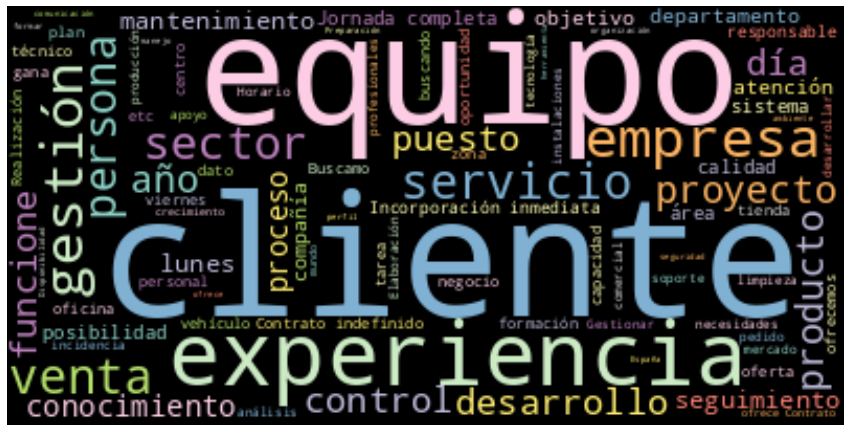

In [6]:
plt.figure(figsize=(15,10))
plt.imshow(base_cloud, interpolation='Bilinear')
plt.axis("off")
plt.show()

Let's do this plot for each of the categories:

In [7]:
df_word_values = {'category' : [], 'word' : [], 'frequency' : []}

for category in df['category'].unique():

    category_text = " ".join(str(each) for each in df.loc[df['category'] == category, 'description'].unique())
    word_frequencies = wordcloud.process_text(category_text)

    for word, val in word_frequencies.items():
        if len(word) > 3:
            df_word_values['category'].append(category)
            df_word_values['word'].append(word)
            df_word_values['frequency'].append(val)

df_word_categories = pd.DataFrame(df_word_values)
df_word_categories.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249819 entries, 0 to 249818
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   category   249819 non-null  object
 1   word       249819 non-null  object
 2   frequency  249819 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 5.7+ MB


In [8]:
for category in df['category'].unique():
    print(f"TOP words of category {category}:")
    print(df_word_categories.loc[df_word_categories['category'] == category].sort_values(by = 'frequency', ascending=False).head(50))
    print()

TOP words of category Administración de empresas:
                         category              word  frequency
2      Administración de empresas           Gestión       2491
320    Administración de empresas           cliente       2380
115    Administración de empresas           empresa       1858
48     Administración de empresas            equipo       1249
14     Administración de empresas       experiencia       1238
94     Administración de empresas           control       1197
55     Administración de empresas      departamento       1069
8      Administración de empresas      contabilidad       1012
244    Administración de empresas           persona       1007
151    Administración de empresas         funciones       1006
278    Administración de empresas    administrativo        855
199    Administración de empresas       seguimiento        849
29     Administración de empresas          servicio        805
33     Administración de empresas            sector        781
260  

In [17]:
df_descriptions = df.loc[df['category'] == "Informática y telecomunicaciones", 'description'].head()

for description, count in zip(df_descriptions.index, df_descriptions.values):
    print("\n", count)
    print(description)


 ¿Qué buscamos? Estamos buscando una persona apasionada por el desarrollo de software, especialmente la parte del Front-end. Necesitamos alguien con conocimiento en Javascript (todo el stack está basado en este lenguaje: Node, React Native, React, Angular...) y que no tenga miedo a los retos. Experiencia y skills requeridas Grado en Ingeniería informática o FP Informática de Sistemas o Tecnología de la Información Al menos 3 años de experiencia en un puesto similar. Alta capacidad de organización y gestión del tiempo, priorización en tareas. Capacidad para desarrollar actividad en un entorno altamente dinámico como una startup. Conocimiento de las siguientes tecnologías: Javascript o Typescript, React, Node, Angular, etc. Alto conocimiento sobre patrones de diseño, UI/UX. ¿Qué vas a hacer/aprender? Definición de tecnologías para el desarrollo. Programación con TypeScript y las últimas tecnologías. Diseño de software. Participación en proyectos de gran recorrido y con mucho impacto. Me

This is ok, but you can get more information from it. Better to do:

- Remove stopwords, accents, all in lowercase
- Lemmatization
- Compute n-grams
- Find word similarities within each group

In [ ]:
conocimiento, lenguaje, experiencia, skills, capacidad, requisito, requisitos, programación, departamento

In [4]:
import nltk
import unicodedata as ud

#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('wordnet')
#nltk.download('omw-1.4')

In [5]:
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords

def tokenization_text(text, min_length = 3):
    """
    Transforms the text into a serie of tokens that will contain only words, hashtags or users.
    Uses the following procedure: normalization, tokenization, stopwords and lemmatization. All in spanish
    """

    # Normalizes the text
    text = text.lower()
    text = ''.join(c for c in ud.normalize('NFD', text) if ud.category(c) != 'Mn')

    # Tokenise words without digits while ignoring punctuation
    tokeniser = RegexpTokenizer(r'[#@]?[^\d\W]+')
    tokens = tokeniser.tokenize(text)
    
    # Remove stopwords and short words
    tokens = [token for token in tokens if token not in stopwords.words('spanish') and len(token) >= min_length]

    # Lemmatization 
    lemmatiser = WordNetLemmatizer()
    lemmas = [lemmatiser.lemmatize(token, pos = 'v') for token in tokens]
    
    return lemmas

In [22]:
# Use case example on first descriptions
for text in df['description'].iloc[2005:2010]:
    print(text)
    print()

Buscamos un Técnico de RRHH generalista cuya misión será dar soporte en todas las áreas de RRHH desde el mismo centro de trabajo ubicado en Cabanillas del Campo, Guadalajara, a una plantilla media de 100 empleados. La misión es gestionar la plantilla del centro reportando directamente al Responsable del Almacén y funcionalmente a la Dirección de RRHH. Las responsabilidades van desde la gestión de tareas administrativas diarias hasta la negociación con el comité, relaciones laborales, selección, formación, evaluaciones de desempeño y prevención de riesgos. - Administración y Nómina - Selección y Formación - Compensación & Beneficios - Prevención Riesgos

NORDEX ENERGY SPAIN busca para sus oficinas sitas en Barásoain personal para cubrir la posición de Director/a de Operaciones Logísticas EPC PM. Las principales funciones del puesto serán: - Liderazgo disciplinario de todas las actividades centrales relacionadas con operaciones logísticas así como liderazgo funcional de los miembros de l

Selección de aquellas partes del texto que me interesan:

1. 'candidatos', 'deben', 'demostrar', 'orientacion', 'hacia', 'temas', 'relacionados', 'gestion', 'negocio', 'confianza', 'mismos', 'buena', 'capacidad', 'comunicacion', 'ambicion', 'adaptabilidad', 'nuevos', 'entornos', 'personas' (Tus responsabilidades serán)

2. x

3. 'perfil', 'buscado', 'licenciatura', 'grado', 'universitario', 'ade', 'derecho', 'areas', 'afines', 'experiencia', 'menos', 'ano', 'gestion', 'investigacion', 'nivel', 'alto', 'ingles', 'nivel', 'alto', 'herramientas', 'ofimaticas', 'persona', 'proactiva', 'organizada', 'capaz', 'trabajar', 'manera', 'autonoma', 'constante', 'supervision', 'acostumbrada', 'trabajos', 'multi', 'tarea' (FINAL)


4. 'necesitamos', 'cursando', 'grado', 'ade', 'economicas', 'ciclo', 'administrativo', 'similar', 'posibilidad', 'firmar', 'convenio', 'centro', 'estudios', 'conocimientos', 'excel', 'power', 'point' (ofrecemos)

5. 'buscamos', 'persona', 'dinamica', 'polivalente', 'ganas', 'capacidad', 'aprendizaje', 'titulacion', 'superior', 'idiomas', 'valorara', 'nivel', 'fluido', 'ingles', 'frances', 'valorable', 'experiencia', 'sector', 'logistico', 'nivel', 'alto', 'paquete', 'office', 'persona', 'proactiva', 'capacidad', 'aprendizaje', 'organizada', 'resolutiva', 'experiencia', 'puestos', 'similares', 'valorable', 'aunque', 'imprescindible' (FINAL)

6. 'perfil', 'candidato', 'experiencia', 'menos', 'tres', 'anos', 'posicion', 'similar', 'nivel', 'competencial', 'ingles', 'sap', 'disponibilidad', 'viajar' (Se ofrece)

7. 'requisitos', 'curriculum', 'ingles', 'curriculums', 'enviados', 'espanol', 'seran', 'automaticamente', 'rechazados', 'favor', 'tener', 'cuenta', 'queremos', 'rechazar', 'ningun', 'candidato', 'detalle', 'economia', 'ade', 'empresariales', 'similar', 'buen', 'expediente', 'academico', 'nivel', 'ingles', 'alto', 'necesario', 'certificado', 'hara', 'prueba', 'importante', 'tener', 'vehiculo', 'propio', 'acceder', 'puesto', 'trabajo', 'alta', 'capacidad', 'aprendizaje', 'muchas', 'ganas', 'crecer', 'nivel', 'personal', 'valorara', 'positivamente', 'conocimientos', 'medio', 'altos', 'ofimatica', 'excel', 'word', 'outlook', 'valorara', 'positivamente', 'experiencia', 'contabilidad', 'finanzas', 'administracion', 'necesaria', 'valorara', 'positivamente', 'vocacion', 'departamento', 'contabilidad', 'finanzas', 'administracion' (FINAL)

8. 'your', 'background', 'years', 'relevant', 'professional', 'experience', 'highly', 'organize', 'and', 'able', 'prioritize', 'effectively', 'excellent', 'communication', 'skills', 'and', 'very', 'high', 'level', 'customer', 'orientation', 'fluent', 'english', 'and', 'spanish', 'willingness', 'work', 'occasionally', 'weekend', 'high', 'ability', 'work', 'team' (FINAL)

9. 'busca', 'persona', 'responsable', 'administracion', 'finanzas', 'contabilidad' 'experiencia', 'demostrable', 'formacion', 'economia', 'finanzas', 'contabilidad', 'posibilidad', 'crecimiento', 'dentro', 'grupo' (Funciones y responsabilidades)

10. 'necesitamos', 'aportes', 'titulacion', 'universitaria', 'superior', 'conocimientos', 'contables', 'financieros', 'manejo', 'modulo', 'financiero', 'sap', 'anos', 'experiencia', 'minima', 'control', 'financiero', 'control', 'interno', 'contabilidad', 'auditoria', 'ingles', 'nivel', 'minimo', 'cuales', 'seran', 'funciones', 'control', 'financiero', 'interno', 'control', 'financieros', 'report', 'mensuales', 'seguimiento', 'conciliacion', 'datos', 'servicios', 'centrales', 'asesoramiento', 'verificacion', 'cumplimiento', 'normativa' (En concreto: )

11. 'perfil', 'buscamos', 'estudiante', 'ciencias', 'actuariales', 'financieras', 'conocimientos', 'normativa', 'solvencia', 'excel', 'word', 'ingles', 'medio', 'alto', 'experiencia', 'requerida', 'posibilidad', 'firmar', 'convenio', 'practicas', 'universidad', 'competencias', 'facilidad', 'trabajo', 'equipo', 'iniciativa', 'proactividad', 'alta', 'capacidad', 'comunicacion', 'responsabilidad', 'organizacion', 'capacidad', 'trabajar', 'equipo', 'entornos', 'exigentes' (ofrece)

12. 'perfil', 'grado', 'licenciatura', 'preferiblemente', 'administracion', 'direccion', 'empresas', 'economia', 'similar', 'anos', 'experiencia', 'auditoria', 'big', 'puesto', 'similar', 

13. 'precisa', 'titulado', 'conocimientos', 'nominas', 'altas', 'bajas', 'seguridad', 'social', 'tramitacion', 'part', 'delt', 'asi', 'conocimientos', 'contabilidad', 'iva', 'sociedades', 'contrato', 'sustitucion', 'maternidad', 'jornada', 'completa' (Posibilidad)

Perfil del candidato - Experiencia de al menos tres años en posición similar. - Nivel competencial en ingles. - SAP - Disponibilidad para viajar. Se ofrece:

#### Beginning:
- perfil buscado
- necesitamos
- buscamos persona
- perfil candidato
- requisitos
- your background (INGLES)
- busca persona
- perfil buscamos?
- PERFIL

#### Things worth mention
- It can be a whole sentence after finding a beginning token
- Or a list like: - First item - Second Item - Last Stop and continue

#### Final
- ofrece
- ofrecemos
- responsabilidades
- Funciones y responsabilidades
- En concreto:
- ofrece
- Se ofrece
- 

I can try analizing whole first sentence / regex list from beginning token until first final token

In [ ]:

1. candidatos deben demostrar (orientacion hacia temas relacionados gestion negocio / confianza mismos / buena capacidad comunicacion / ambicion adaptabilidad nuevos entornos personas
2. busqueda (finance manager)
3. buscar (tecnico gestion experiencia trabajar gestion economico administrativa proyectos), 
    perfil buscado: licenciatura grado universitario ade derecho areas afines experiencia menos ano (XD) gestion investigacion nivel alto ingles nivel alto herramientas ofimaticas persona proactiv
4. 

capacidad, responsabilidad, responsabilidades, ==> 
ofrecemos

In [92]:
from sklearn.feature_extraction.text import CountVectorizer

def plot_top_ngrams_barchart(text, axs, n=2, k=10):
    """
        Plots a barchart of the `k` most common `n` n-grams words in a corpus. 
    """
    new = text.str.split().values.tolist()
    corpus = [word for i in new for word in i]

    def _get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
        words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq[:k]


    top_n_bigrams = _get_top_ngram(text, n)[:k]
    x,y = map(list,zip(*top_n_bigrams))

    sns.barplot( ax = axs, x = y, y = x)

plot_top_ngrams_barchart(text)

In [ ]:

from sklearn.feature_extraction.text import HashingVectorizer
import re
import os
import pickle

cur_dir = os.path.dirname(__file__)
stop = pickle.load(open(os.path.join(cur_dir, 'pkl_objects','stopwords.pkl'), 'rb'))

def tokenizer(text):
    # Caràcters de puntuació per suprimir
    text = re.sub('<[^>]*>', '', text)

    # Trobem tots els emoticons per afegir-los al final
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)

    # Eliminem caràcters que no siguin paraules i tot en lletra minúscula
    text = (re.sub('[\W]+', ' ', text.lower()) + ' '.join(emoticons).replace('-',''))

    # Retornem el text un cop processat
    return [word for word in text.split() if word not in stop]

# Iniciem el vectoritzador
vect = HashingVectorizer(decode_error='ignore', n_features= 2**21,
                            preprocessor=None, tokenizer=tokenizer)